In [ ]:
!git clone https://github.com/ultralytics/ultralytics -b main
%pip install -qe ultralytics

Cloning into 'ultralytics'...
remote: Enumerating objects: 28876, done.
remote: Counting objects: 100% (588/588), done.
remote: Compressing objects: 100% (379/379), done.
remote: Total 28876 (delta 322), reused 434 (delta 208), pack-reused 28288
Receiving objects: 100% (28876/28876), 16.79 MiB | 20.30 MiB/s, done.
Resolving deltas: 100% (20351/20351), done.
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 49.1 MB/s eta 0:00:00
  Building editable for ultralytics (pyproject.toml) ... done


In [ ]:
%cd /content/ultralytics/

/content/ultralytics


In [ ]:
!pip install -e .

Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.2.32-0.editable-py3-none-any.whl size=22993 sha256=6176c3bccccf553e91a51c499ef69733eb293846ec36da73c070812c0920dabd
  Stored in directory: /tmp/pip-ephem-wheel-cache-xz6vvah2/wheels/9a/cd/d5/95912172899f8ec640166ff6eef49156b1b00d6b2ade4a3cb1
Successfully built ultralytics
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.2.32
    Uninstalling ultralytics-8.2.32:
      Successfully uninstalled ultralytics-8.2.32


In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="RpYO1whb6pkt6Clat71r")
project = rf.workspace("machine-learning-ssu0m").project("yolov8-parte3")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.32, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Yolov8-Parte3-1 in yolov8:: 100%|██████████| 660/660 [00:00<00:00, 3346.90it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8.yaml data=/content/ultralytics/Yolov8-Parte3-1/data.yaml epochs=100 imgsz=416 batch=16   name=yolov8_result cache=True

WARNING ⚠️ no model scale passed. Assuming scale='n'.
Ultralytics YOLOv8.2.32 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8.yaml, data=/content/ultralytics/Yolov8-Parte3-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=True, device=None, workers=8, project=None, name=yolov8_result2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt

In [ ]:
import matplotlib.pyplot as plt

(-0.5, 2399.5, 1199.5, -0.5)

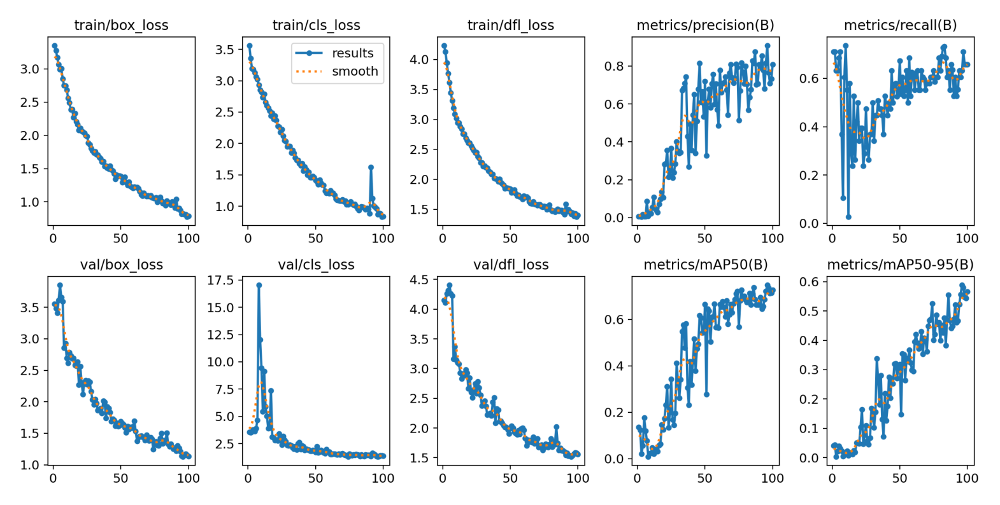

In [ ]:
img1 = plt.imread('/content/ultralytics/runs/detect/yolov8_result2/results.png')
plt.figure(figsize=(20, 20))
plt.imshow(img1)
plt.axis('off')

(-0.5, 1791.5, 1791.5, -0.5)

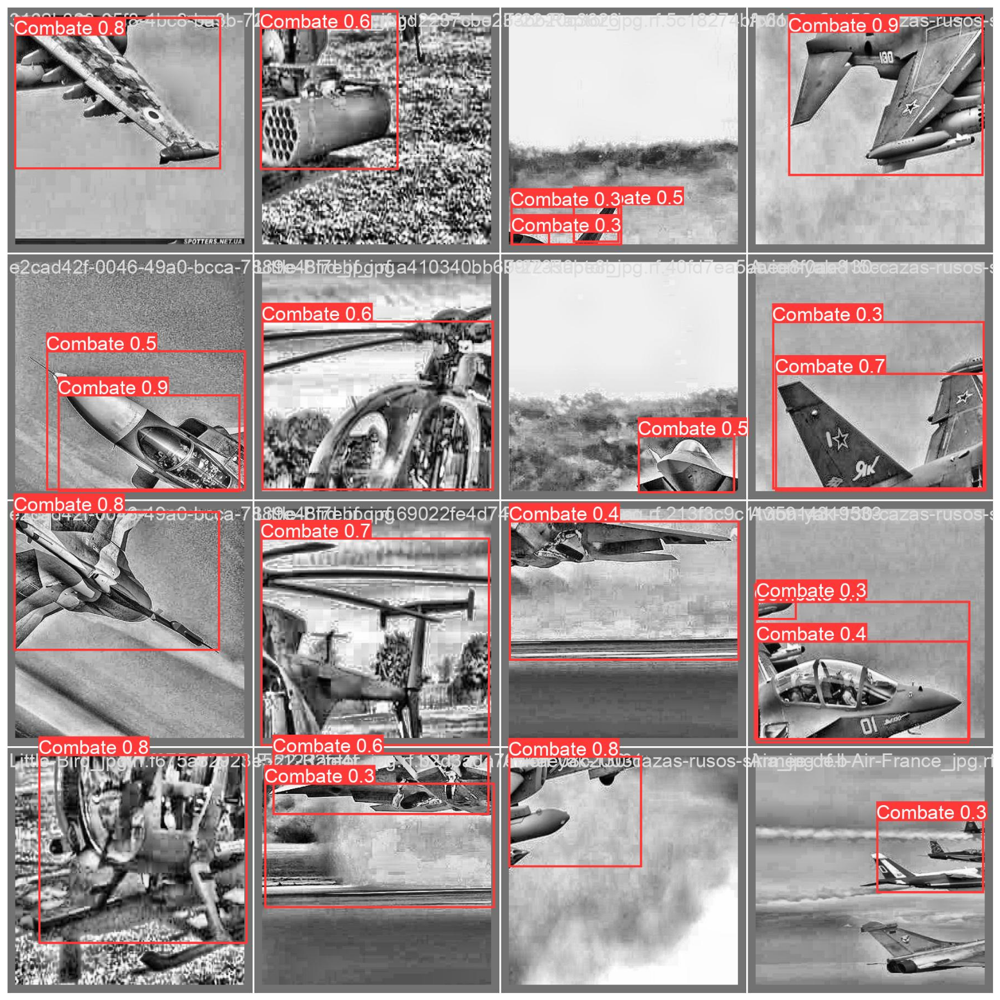

In [ ]:
img2 = plt.imread('/content/ultralytics/runs/detect/yolov8_result2/val_batch0_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(img2)
plt.axis('off')

In [ ]:
!yolo val model=/content/ultralytics/runs/detect/yolov8_result2/weights/best.pt data=/content/ultralytics/Yolov8-Parte3-1/data.yaml conf=0.5

Ultralytics YOLOv8.2.32 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8 summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/ultralytics/Yolov8-Parte3-1/valid/labels.cache... 28 images, 0 backgrounds, 0 corrupt: 100% 28/28 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:04<00:00,  2.32s/it]
                   all         28         38      0.923      0.632      0.786      0.642
Speed: 5.3ms preprocess, 126.7ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /content/ultralytics/runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


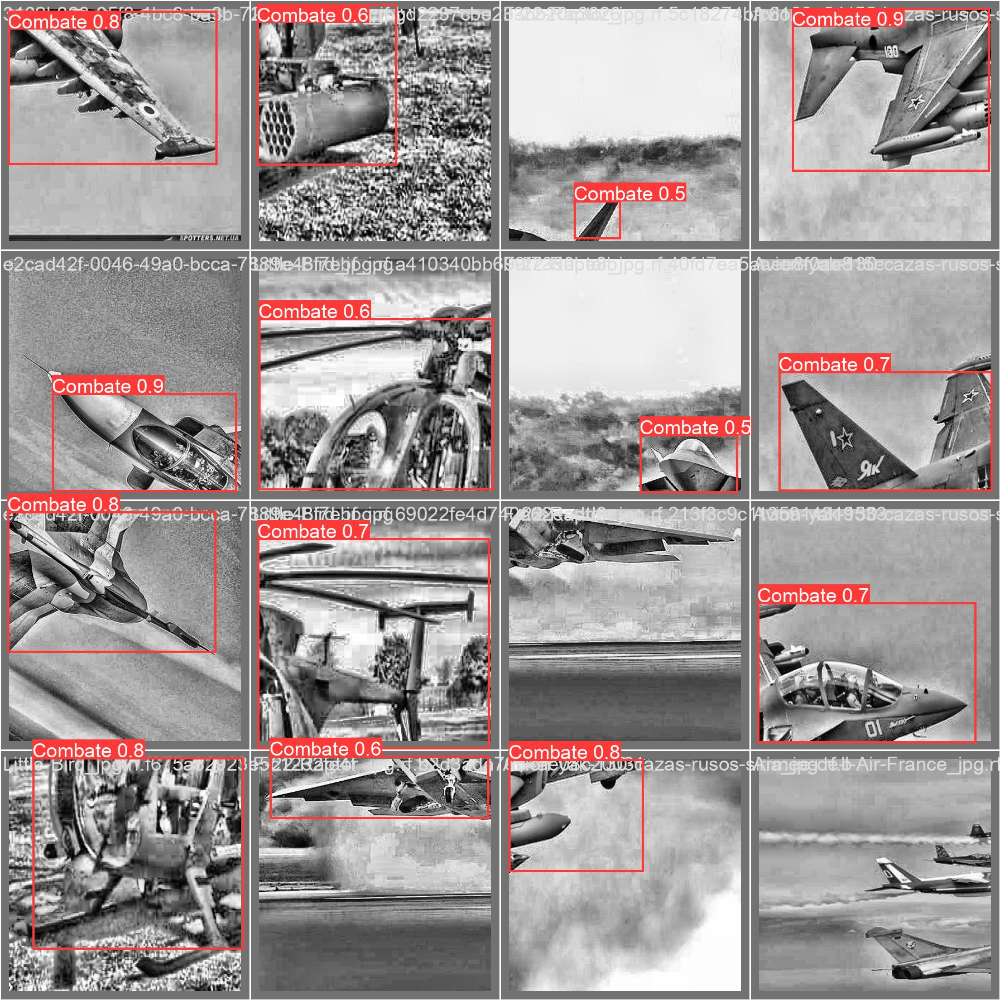

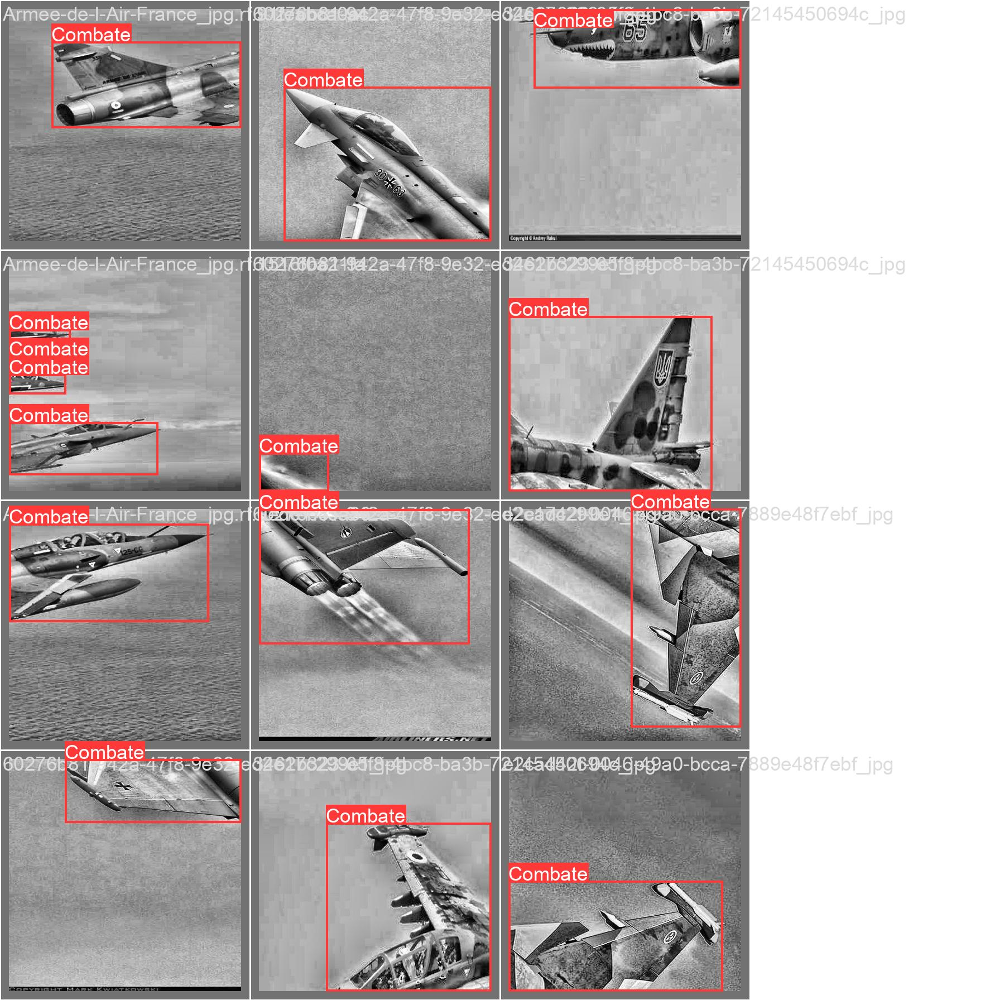

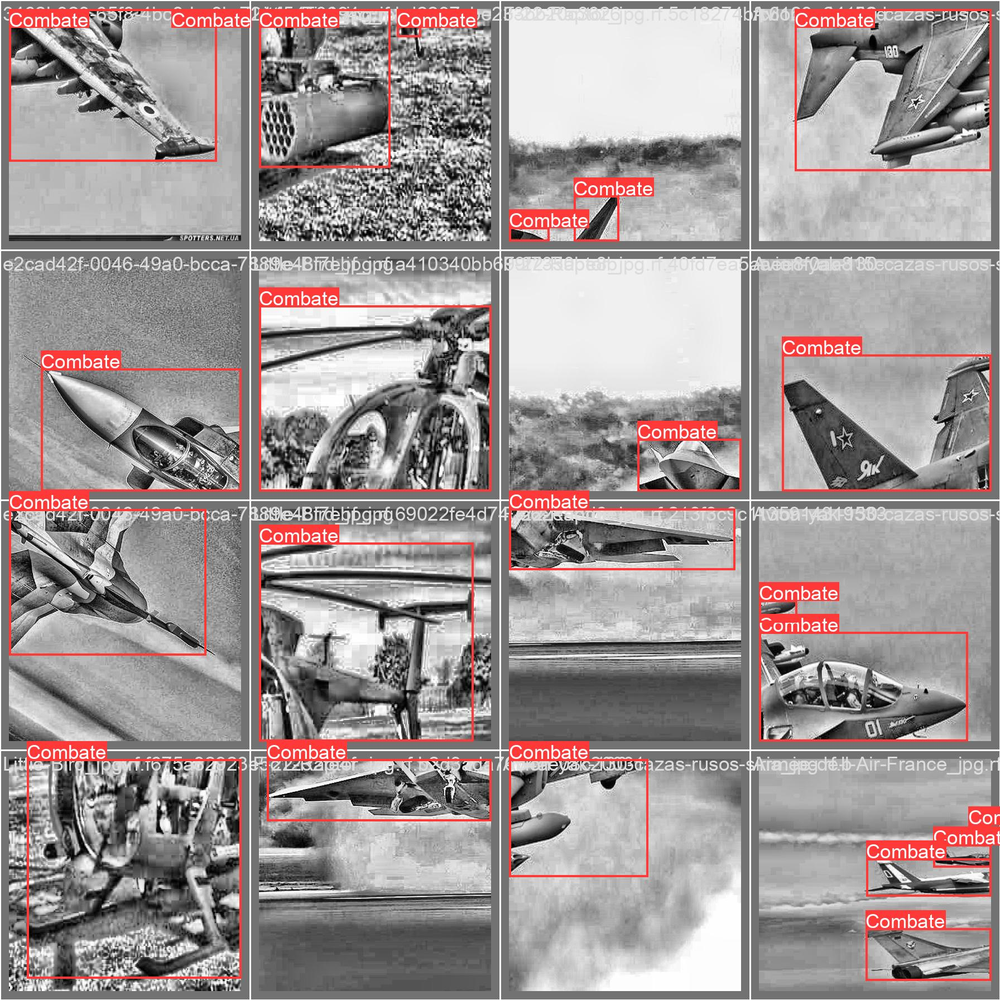

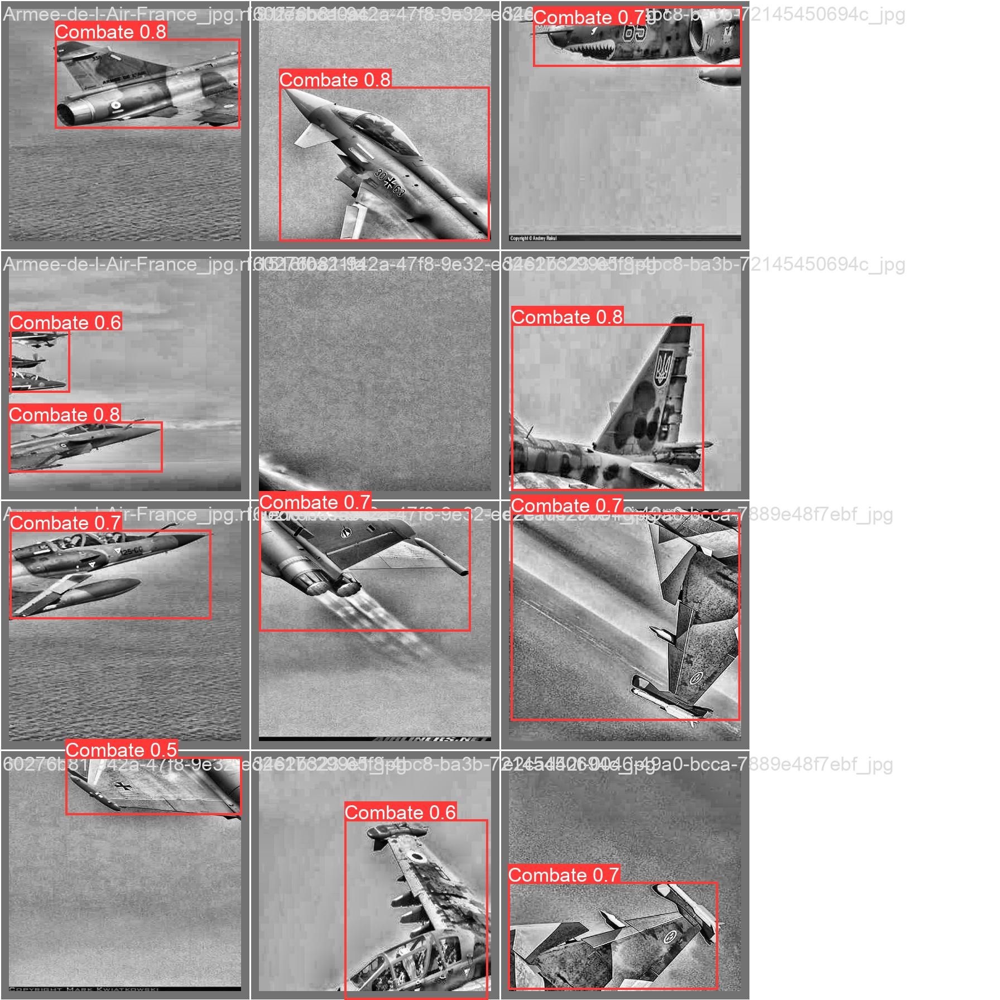

In [ ]:
import glob
from IPython.display import Image, display

for imagename in glob.glob('/content/ultralytics/runs/detect/val/*.jpg'):
  display(Image(filename=imagename))
  print("\n")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/ultralytics/runs

<IPython.core.display.Javascript object>

**La precisión es de 0.909 y el recall es de 0.632. Esto indica que el modelo es bastante preciso al identificar aviones de combate, aunque su sensibilidad es muy baja esta podria aumentar con un entrenamiento de mas epocas o mas variedad de imagenes en el dataset creado.**